## 0. Environment check

In [ ]:
import os
import random
from pathlib import Path

import numpy as np
import torch

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

volume_root = Path(os.environ.get("ARGUS_VOLUME_ROOT", "/mnt/argus-poc"))
print(f"Modal volume root: {volume_root}")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA version: {torch.version.cuda}")
gpu_count = torch.cuda.device_count()
print(f"torch.cuda.device_count(): {gpu_count}")
assert torch.cuda.is_available(), "GPU is required. Enable a GPU in Modal notebook settings."
for idx in range(gpu_count):
    props = torch.cuda.get_device_properties(idx)
    print(f"GPU {idx}: {props.name}, VRAM={props.total_memory / 1e9:.2f} GB")
if gpu_count < 2:
    print("[WARN] Only one GPU detected. Training will run, but Ultralytics multi-GPU DDP will not be available.")
else:
    print("[DONE] Multi-GPU runtime detected")

Modal volume root: /mnt/nightswatch-poc
PyTorch version: 2.8.0+cu129
CUDA version: 12.9
torch.cuda.device_count(): 1
GPU 0: NVIDIA L4, VRAM=23.66 GB
[WARN] Only one GPU detected. Training will run, but Ultralytics multi-GPU DDP will not be available.


## 1. Install dependencies

In [2]:
!pip install "ultralytics==8.3.*" onnxruntime-gpu==1.24.4 onnx==1.21.0 roboflow==1.3.3 gdown==6.0.0 pycocotools==2.0.11 kaggle==2.0.1 pandas==3.0.2 --quiet

import importlib.metadata as metadata
import onnxruntime as ort
import torch

packages = ["ultralytics", "onnxruntime-gpu", "onnx", "roboflow", "gdown", "pycocotools", "kaggle", "pandas"]
for package in packages:
    try:
        print(f"{package}: {metadata.version(package)}")
    except metadata.PackageNotFoundError:
        print(f"{package}: not found")
print(f"ONNX Runtime providers: {ort.get_available_providers()}")
print(f"Torch CUDA available: {torch.cuda.is_available()}")
print("[DONE] Dependencies installed")


[notice] A new release of pip is available: 24.3.1 -> 26.1
[notice] To update, run: pip install --upgrade pip
ultralytics: 8.3.253
onnxruntime-gpu: 1.24.4
onnx: 1.21.0
roboflow: 1.3.3
gdown: 6.0.0
pycocotools: 2.0.11
kaggle: 2.0.1
pandas: 3.0.2
ONNX Runtime providers: ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']
Torch CUDA available: True
[DONE] Dependencies installed


## 2. Clone GitHub repository

In [ ]:
import os
import subprocess
import sys
from pathlib import Path
from datetime import datetime

volume_root = Path(os.environ.get("ARGUS_VOLUME_ROOT", "/mnt/argus-poc"))
repo_url = os.environ.get(
    "ARGUS_REPO_URL", "https://github.com/AdityaChaudhary2913/Argus-PoC.git"
)
repo_dir = volume_root / "Argus"
output_dir = volume_root / "poc_outputs"
data_dir = volume_root / "datasets"
yolo_config_dir = volume_root / ".ultralytics"
volume_root.mkdir(parents=True, exist_ok=True)
output_dir.mkdir(parents=True, exist_ok=True)
data_dir.mkdir(parents=True, exist_ok=True)
yolo_config_dir.mkdir(parents=True, exist_ok=True)
os.environ["ARGUS_VOLUME_ROOT"] = str(volume_root)
os.environ["YOLO_CONFIG_DIR"] = str(yolo_config_dir)
def run(cmd, **kw):
    return subprocess.run(cmd, check=True, text=True, capture_output=True, **kw)

if repo_dir.exists():
    print(f"Repository already exists at {repo_dir}; refreshing from remote")

    dirty = run(["git", "-C", str(repo_dir), "status", "--porcelain"]).stdout.strip()
    stashed = False
    stash_msg = f"autostash before pull {datetime.utcnow().isoformat()}Z"

    if dirty:
        print("Repo has local changes; stashing them temporarily...")
        run(["git", "-C", str(repo_dir), "stash", "push", "-u", "-m", stash_msg])
        stashed = True

    run(["git", "-C", str(repo_dir), "fetch", "origin"])

    # Prefer pulling the current branch; fall back to origin/HEAD if detached.
    branch = run(["git", "-C", str(repo_dir), "rev-parse", "--abbrev-ref", "HEAD"]).stdout.strip()
    if branch == "HEAD":
        run(["git", "-C", str(repo_dir), "pull", "--ff-only", "origin", "HEAD"])
    else:
        run(["git", "-C", str(repo_dir), "pull", "--ff-only", "origin", branch])

    if stashed:
        print("Re-applying stashed changes...")
        try:
            subprocess.run(["git", "-C", str(repo_dir), "stash", "pop"], check=True)
        except subprocess.CalledProcessError:
            print("stash pop had conflicts. Your stash is still saved; run:")
            print(f"  git -C {repo_dir} stash list")
            print(f"  git -C {repo_dir} stash pop")
            raise
else:
    subprocess.run(["git", "clone", repo_url, str(repo_dir)], check=True)
%cd /mnt/nightswatch-poc/NightsWatch
if str(repo_dir) not in sys.path:
    sys.path.insert(0, str(repo_dir))
commit = subprocess.run(["git", "-C", str(repo_dir), "rev-parse", "--short", "HEAD"], text=True, capture_output=True, check=True).stdout.strip()
print(f"[DONE] Repository ready: {repo_dir}")
print(f"[DONE] Repo commit: {commit}")
print(f"[DONE] Dataset root: {data_dir}")
print(f"[DONE] Output root: {output_dir}")

Repository already exists at /mnt/nightswatch-poc/NightsWatch; refreshing from remote
Repo has local changes; stashing them temporarily...


/tmp/ipykernel_295/1055464029.py:29: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  stash_msg = f"autostash before pull {datetime.utcnow().isoformat()}Z"


Re-applying stashed changes...
Already up to date.
On branch main
Your branch is up to date with 'origin/main'.

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	runs/

nothing added to commit but untracked files present (use "git add" to track)
Dropped refs/stash@{0} (3cdcb0726d4004b151101fc48c00f62cfb4e12c1)
/__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/NightsWatch
[DONE] Repository ready: /mnt/nightswatch-poc/NightsWatch
[DONE] Repo commit: 2dc4c7e
[DONE] Dataset root: /mnt/nightswatch-poc/datasets
[DONE] Output root: /mnt/nightswatch-poc/poc_outputs


## 3. Load prepared dataset manifest

In [4]:
import json
from pathlib import Path

import pandas as pd

from utils.env import get_log_dir

log_dir = get_log_dir()
prep_manifest_path = log_dir / "prep_manifest.json"
if not prep_manifest_path.exists():
    raise FileNotFoundError(
        f"Prep manifest not found at {prep_manifest_path}. Run run_prep.ipynb first on the same mounted volume."
    )
prep_manifest = json.loads(prep_manifest_path.read_text(encoding="utf-8"))
required_paths = [
    prep_manifest["thermal_yaml"],
    prep_manifest["eo_yaml"],
    prep_manifest["ir_yaml"],
    prep_manifest["pair_manifest"],
]
missing = [path for path in required_paths if not Path(path).exists()]
if missing:
    raise FileNotFoundError(f"Prepared dataset files are missing: {missing}")
thermal_yaml = prep_manifest["thermal_yaml"]
eo_yaml = prep_manifest["eo_yaml"]
ir_yaml = prep_manifest["ir_yaml"]
pair_manifest = prep_manifest["pair_manifest"]
dataset_records = prep_manifest["dataset_records"]
display(pd.DataFrame(dataset_records))
print(f"[DONE] Loaded prep manifest: {prep_manifest_path}")
print(f"[DONE] Thermal dataset yaml: {thermal_yaml}")
print(f"[DONE] EO dataset yaml: {eo_yaml}")
print(f"[DONE] IR dataset yaml: {ir_yaml}")

,dataset,root,source,num_classes,classes,train_images,val_images,train_labels,val_labels,empty_label_files,invalid_labels,sample_image_size,ok
0,Thermal,/__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/dat...,unknown,5,"[person, bicycle, car, dog, other_vehicle]",12026,1360,12026,1360,0,0,"[640, 512]",True
1,EO,/__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/dat...,unknown,5,"[car, truck, bus, van, freight_car]",17467,8746,17467,8746,0,0,"[840, 712]",True
2,IR,/__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/dat...,unknown,5,"[car, truck, bus, van, freight_car]",17940,8965,17940,8965,0,0,"[840, 712]",True


[DONE] Loaded prep manifest: /mnt/nightswatch-poc/poc_outputs/logs/prep_manifest.json
[DONE] Thermal dataset yaml: /mnt/nightswatch-poc/poc_outputs/dataset_configs/flir_thermal.yaml
[DONE] EO dataset yaml: /mnt/nightswatch-poc/poc_outputs/dataset_configs/dronevehicle_rgb.yaml
[DONE] IR dataset yaml: /mnt/nightswatch-poc/poc_outputs/dataset_configs/dronevehicle_ir.yaml


## 4. Training - FLIR thermal (LWIR unimodal)

In [5]:
import json
from dataclasses import replace
from pathlib import Path

from train.train_single import run_training_job
from train.training_configs import FLIR_THERMAL_CONFIG
from utils.env import get_log_dir

training_summary_path = get_log_dir() / "training.json"
if training_summary_path.exists():
    training_summaries = json.loads(training_summary_path.read_text(encoding="utf-8"))
else:
    training_summaries = {}

if "thermal" in training_summaries and Path(training_summaries["thermal"]["model_artifact"]).exists():
    thermal_train = training_summaries["thermal"]
    thermal_weights = thermal_train["model_artifact"]
    print(f"[DONE] Reusing existing thermal weights: {thermal_weights}")
else:
    thermal_config = replace(FLIR_THERMAL_CONFIG, name="flir_thermal_yolo11s")
    print(json.dumps(thermal_config.to_dict(), indent=2))
    thermal_train = run_training_job(thermal_yaml, thermal_config, artifact_name="thermal_best.pt")
    thermal_weights = thermal_train["model_artifact"]
    training_summaries["thermal"] = thermal_train
    training_summary_path.write_text(json.dumps(training_summaries, indent=2), encoding="utf-8")
print(f"[DONE] Thermal training ready: {thermal_weights}")

{
  "name": "flir_thermal_yolo11s",
  "model_path": "yolo11s.pt",
  "epochs": 50,
  "imgsz": 640,
  "initial_batch": 32,
  "workers": 4,
  "seed": 42,
  "patience": 15,
  "device": "0,1",
  "auto_extend_threshold_map50": 0.65,
  "extra_epochs": 20
}
2026-05-01 18:27:23 | INFO | train.train_single | Training config: {
  "name": "flir_thermal_yolo11s",
  "model_path": "yolo11s.pt",
  "epochs": 50,
  "imgsz": 640,
  "initial_batch": 32,
  "workers": 4,
  "seed": 42,
  "patience": 15,
  "device": "0,1",
  "auto_extend_threshold_map50": 0.65,
  "extra_epochs": 20
}
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/mnt/nightswatch-poc/.ultralytics/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
New https://pypi.org/project/ultralytics/8.4.45 available 😃 Update with 'pip install -U ultralytics'
U

## 5. Training - EO unimodal (DroneVehicle RGB or LLVIP visible)

In [6]:
from dataclasses import replace
from pathlib import Path

from train.training_configs import EO_UNIMODAL_CONFIG

if "eo" in training_summaries and Path(training_summaries["eo"]["model_artifact"]).exists():
    eo_train = training_summaries["eo"]
    eo_weights = eo_train["model_artifact"]
    print(f"[DONE] Reusing existing EO weights: {eo_weights}")
else:
    eo_config = replace(EO_UNIMODAL_CONFIG, name="eo_unimodal_yolo11s")
    print(json.dumps(eo_config.to_dict(), indent=2))
    eo_train = run_training_job(eo_yaml, eo_config, artifact_name="eo_best.pt")
    eo_weights = eo_train["model_artifact"]
    training_summaries["eo"] = eo_train
    training_summary_path.write_text(json.dumps(training_summaries, indent=2), encoding="utf-8")
print(f"[DONE] EO training ready: {eo_weights}")

{
  "name": "eo_unimodal_yolo11s",
  "model_path": "yolo11s.pt",
  "epochs": 30,
  "imgsz": 640,
  "initial_batch": 32,
  "workers": 4,
  "seed": 42,
  "patience": 15,
  "device": "0,1",
  "auto_extend_threshold_map50": null,
  "extra_epochs": 20
}
2026-05-01 20:40:03 | INFO | train.train_single | Training config: {
  "name": "eo_unimodal_yolo11s",
  "model_path": "yolo11s.pt",
  "epochs": 30,
  "imgsz": 640,
  "initial_batch": 32,
  "workers": 4,
  "seed": 42,
  "patience": 15,
  "device": "0,1",
  "auto_extend_threshold_map50": null,
  "extra_epochs": 20
}
New https://pypi.org/project/ultralytics/8.4.46 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.253 🚀 Python-3.12.6 torch-2.8.0+cu129 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=Fa

## 6. Training - IR unimodal (DroneVehicle IR or LLVIP infrared)

In [7]:
from dataclasses import replace
from pathlib import Path

from train.training_configs import IR_UNIMODAL_CONFIG

if "ir" in training_summaries and Path(training_summaries["ir"]["model_artifact"]).exists():
    ir_train = training_summaries["ir"]
    ir_weights = ir_train["model_artifact"]
    print(f"[DONE] Reusing existing IR weights: {ir_weights}")
else:
    ir_config = replace(IR_UNIMODAL_CONFIG, name="ir_unimodal_yolo11s")
    print(json.dumps(ir_config.to_dict(), indent=2))
    ir_train = run_training_job(ir_yaml, ir_config, artifact_name="ir_best.pt")
    ir_weights = ir_train["model_artifact"]
    training_summaries["ir"] = ir_train
    training_summary_path.write_text(json.dumps(training_summaries, indent=2), encoding="utf-8")
print(f"[DONE] IR training ready: {ir_weights}")

{
  "name": "ir_unimodal_yolo11s",
  "model_path": "yolo11s.pt",
  "epochs": 30,
  "imgsz": 640,
  "initial_batch": 32,
  "workers": 4,
  "seed": 42,
  "patience": 15,
  "device": "0,1",
  "auto_extend_threshold_map50": null,
  "extra_epochs": 20
}
2026-05-01 23:21:47 | INFO | train.train_single | Training config: {
  "name": "ir_unimodal_yolo11s",
  "model_path": "yolo11s.pt",
  "epochs": 30,
  "imgsz": 640,
  "initial_batch": 32,
  "workers": 4,
  "seed": 42,
  "patience": 15,
  "device": "0,1",
  "auto_extend_threshold_map50": null,
  "extra_epochs": 20
}
New https://pypi.org/project/ultralytics/8.4.46 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.253 🚀 Python-3.12.6 torch-2.8.0+cu129 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=Fa

## 7. Benchmark - latency and mAP profiling

In [16]:
import pandas as pd

from eval.benchmark import benchmark_model

benchmark_jobs = [
    ("thermal_yolo11s", thermal_weights, thermal_yaml),
    ("eo_yolo11s", eo_weights, eo_yaml),
    ("ir_yolo11s", ir_weights, ir_yaml),
]
benchmarks = []
for model_name, weights, dataset_yaml in benchmark_jobs:
    result = benchmark_model(weights, dataset_yaml, model_name=model_name)
    benchmarks.append(result)
    print(f"[DONE] Benchmark complete: {model_name}, FP32={result['fp32_ms']:.1f}ms, FP16={result['fp16_ms']:.1f}ms, ONNX={result['onnx_ms']:.1f}ms")

display(pd.DataFrame([
    {
        "model": item["model_name"],
        "mAP@0.5": item["map50"],
        "mAP@0.5:0.95": item["map50_95"],
        "FP32 ms": item["fp32_ms"],
        "FP16 ms": item["fp16_ms"],
        "ONNX ms": item["onnx_ms"],
        "Jetson INT8 est ms": item["projected_jetson_int8_ms"],
        "Mem GB": item["peak_memory_gb"],
    }
    for item in benchmarks
]))

2026-05-02 02:24:54 | INFO | eval.benchmark | Running validation for thermal_yolo11s
Ultralytics 8.3.253 🚀 Python-3.12.6 torch-2.8.0+cu129 CUDA:0 (NVIDIA L4, 22563MiB)
YOLO11s summary (fused): 100 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 137.3±34.2 MB/s, size: 143.2 KB)
val: Scanning /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/datasets/flir_thermal/labels/val.cache... 1360 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1360/1360 438.8Mit/s 0.0s
val: /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/datasets/flir_thermal/images/val/FLIR_09042.jpeg: 1 duplicate labels removed
val: /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/datasets/flir_thermal/images/val/FLIR_09055.jpeg: 1 duplicate labels removed
val: /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/datasets/flir_thermal/images/val/FLIR_09653.jpeg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 

/usr/local/lib/python3.12/site-packages/torch/onnx/utils.py:1397: OnnxExporterWarning: Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 
  warnings.warn(


ONNX: export success ✅ 0.9s, saved as '/mnt/nightswatch-poc/poc_outputs/models/thermal_best.onnx' (36.1 MB)

Export complete (1.2s)
Results saved to /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/poc_outputs/models
Predict:         yolo predict task=detect model=/mnt/nightswatch-poc/poc_outputs/models/thermal_best.onnx imgsz=640  
Validate:        yolo val task=detect model=/mnt/nightswatch-poc/poc_outputs/models/thermal_best.onnx imgsz=640 data=/mnt/nightswatch-poc/poc_outputs/dataset_configs/flir_thermal.yaml  
Visualize:       https://netron.app


2026-05-02 02:25:16.156955016 [W:onnxruntime:, transformer_memcpy.cc:111 ApplyImpl] 8 Memcpy nodes are added to the graph main_graph for CUDAExecutionProvider. It might have negative impact on performance (including unable to run CUDA graph). Set session_options.log_severity_level=1 to see the detail logs before this message.


✅ [DONE] Benchmark complete: thermal_yolo11s, FP32=8.3ms, FP16=10.5ms, ONNX=5.8ms
[DONE] Benchmark complete: thermal_yolo11s, FP32=8.3ms, FP16=10.5ms, ONNX=5.8ms
2026-05-02 02:25:27 | INFO | eval.benchmark | Running validation for eo_yolo11s
Ultralytics 8.3.253 🚀 Python-3.12.6 torch-2.8.0+cu129 CUDA:0 (NVIDIA L4, 22563MiB)
YOLO11s summary (fused): 100 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 291.8±167.7 MB/s, size: 259.3 KB)
val: Scanning /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/datasets/dronevehicle_rgb/labels/val.cache... 8746 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 8746/8746 3.1Git/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 547/547 7.7it/s 1:11
                   all       8746     150544      0.708      0.616      0.615      0.427
Speed: 1.6ms preprocess, 3.5ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /__mod

/usr/local/lib/python3.12/site-packages/torch/onnx/utils.py:1397: OnnxExporterWarning: Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 
  warnings.warn(


ONNX: export success ✅ 1.0s, saved as '/mnt/nightswatch-poc/poc_outputs/models/eo_best.onnx' (36.1 MB)

Export complete (1.3s)
Results saved to /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/poc_outputs/models
Predict:         yolo predict task=detect model=/mnt/nightswatch-poc/poc_outputs/models/eo_best.onnx imgsz=640  
Validate:        yolo val task=detect model=/mnt/nightswatch-poc/poc_outputs/models/eo_best.onnx imgsz=640 data=/mnt/nightswatch-poc/poc_outputs/dataset_configs/dronevehicle_rgb.yaml  
Visualize:       https://netron.app


2026-05-02 02:26:55.720854962 [W:onnxruntime:, transformer_memcpy.cc:111 ApplyImpl] 8 Memcpy nodes are added to the graph main_graph for CUDAExecutionProvider. It might have negative impact on performance (including unable to run CUDA graph). Set session_options.log_severity_level=1 to see the detail logs before this message.


✅ [DONE] Benchmark complete: eo_yolo11s, FP32=7.9ms, FP16=10.5ms, ONNX=6.4ms
[DONE] Benchmark complete: eo_yolo11s, FP32=7.9ms, FP16=10.5ms, ONNX=6.4ms
2026-05-02 02:27:07 | INFO | eval.benchmark | Running validation for ir_yolo11s
Ultralytics 8.3.253 🚀 Python-3.12.6 torch-2.8.0+cu129 CUDA:0 (NVIDIA L4, 22563MiB)
YOLO11s summary (fused): 100 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.0 ms, read: 280.7±88.7 MB/s, size: 212.7 KB)
val: Scanning /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/datasets/dronevehicle_ir/labels/val.cache... 8965 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 8965/8965 2.1Git/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 561/561 7.6it/s 1:14
                   all       8965     164710      0.716      0.647      0.643      0.474
Speed: 1.5ms preprocess, 3.6ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /__modal/volumes/v

/usr/local/lib/python3.12/site-packages/torch/onnx/utils.py:1397: OnnxExporterWarning: Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 
  warnings.warn(


ONNX: export success ✅ 0.9s, saved as '/mnt/nightswatch-poc/poc_outputs/models/ir_best.onnx' (36.1 MB)

Export complete (1.1s)
Results saved to /__modal/volumes/vo-QETx2Tc26a4ifR18mnbMlL/poc_outputs/models
Predict:         yolo predict task=detect model=/mnt/nightswatch-poc/poc_outputs/models/ir_best.onnx imgsz=640  
Validate:        yolo val task=detect model=/mnt/nightswatch-poc/poc_outputs/models/ir_best.onnx imgsz=640 data=/mnt/nightswatch-poc/poc_outputs/dataset_configs/dronevehicle_ir.yaml  
Visualize:       https://netron.app


2026-05-02 02:28:37.486100145 [W:onnxruntime:, transformer_memcpy.cc:111 ApplyImpl] 8 Memcpy nodes are added to the graph main_graph for CUDAExecutionProvider. It might have negative impact on performance (including unable to run CUDA graph). Set session_options.log_severity_level=1 to see the detail logs before this message.


✅ [DONE] Benchmark complete: ir_yolo11s, FP32=7.8ms, FP16=9.8ms, ONNX=5.5ms
[DONE] Benchmark complete: ir_yolo11s, FP32=7.8ms, FP16=9.8ms, ONNX=5.5ms


,model,mAP@0.5,mAP@0.5:0.95,FP32 ms,FP16 ms,ONNX ms,Jetson INT8 est ms,Mem GB
0,thermal_yolo11s,0.994990,0.984995,8.274146,10.497231,5.775454,8.085635,0.180617
1,eo_yolo11s,0.614518,0.426905,7.930779,10.490680,6.351813,8.892538,0.149247
2,ir_yolo11s,0.643170,0.474051,7.842286,9.774831,5.517485,7.724480,0.150164


## 8. Late-fusion baseline

In [17]:
import pandas as pd

from eval.fusion_baseline import run_late_fusion

fusion_result = run_late_fusion(eo_weights, ir_weights, pair_manifest)
display(pd.DataFrame(fusion_result["table"]))
print("[DONE] Late-fusion baseline complete")

late fusion: 100%|█████████████████████████████████████████████████████████| 8746/8746 [05:54<00:00, 24.64it/s]


✅ [DONE] Late-fusion baseline complete: EO mAP@0.5=0.547, IR mAP@0.5=0.509, fusion mAP@0.5=0.568


,modality,map50,map50_95
0,EO only,0.546766,0.382554
1,IR only,0.508649,0.336301
2,Late fusion,0.568217,0.400379
3,Δ vs best solo,0.021451,0.017825


[DONE] Late-fusion baseline complete


## 9. Detection visualisations

✅ [DONE] Detection visualisations saved: 10 images for thermal_yolo11s
✅ [DONE] Detection visualisations saved: 10 images for eo_yolo11s
✅ [DONE] Detection visualisations saved: 10 images for ir_yolo11s


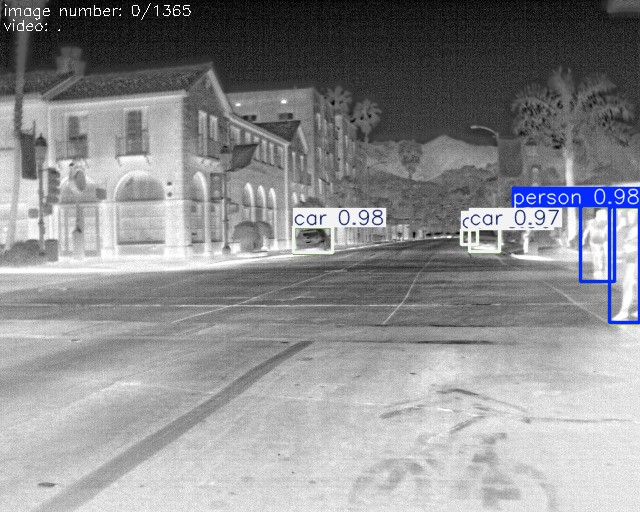

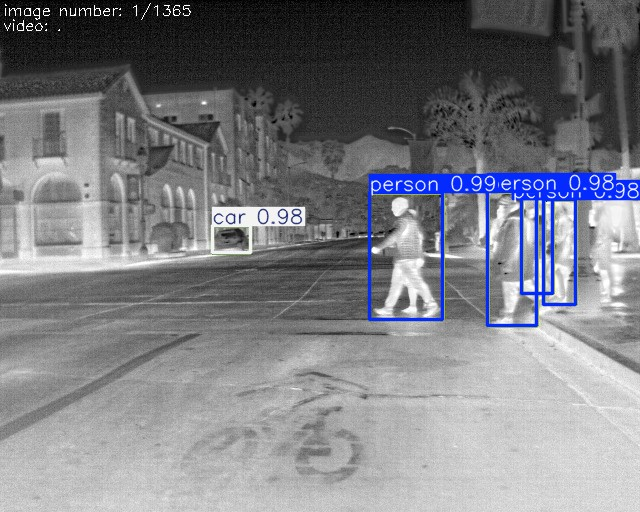

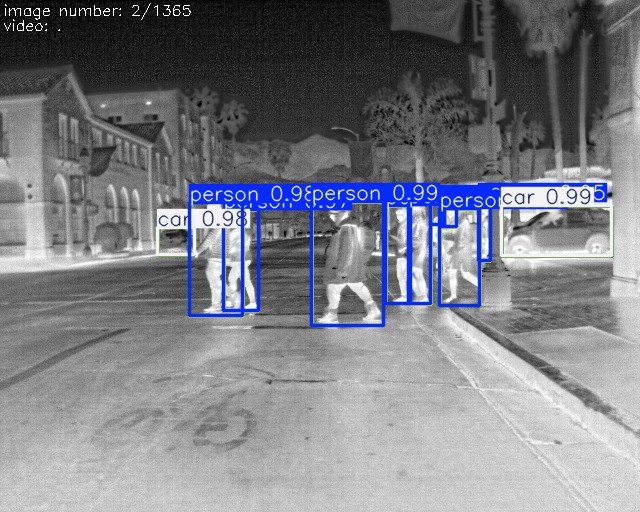

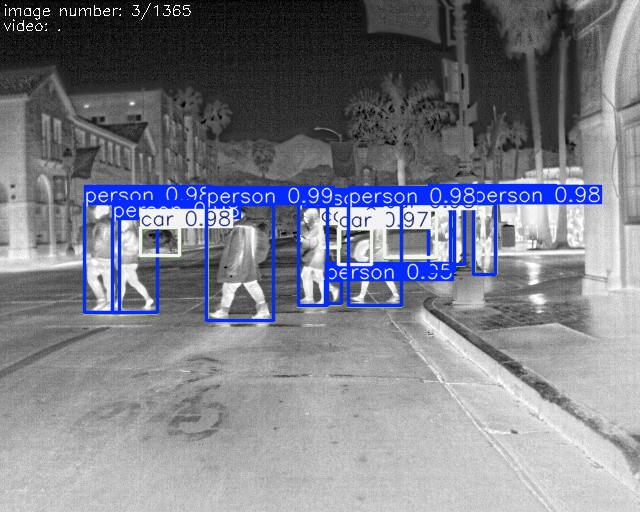

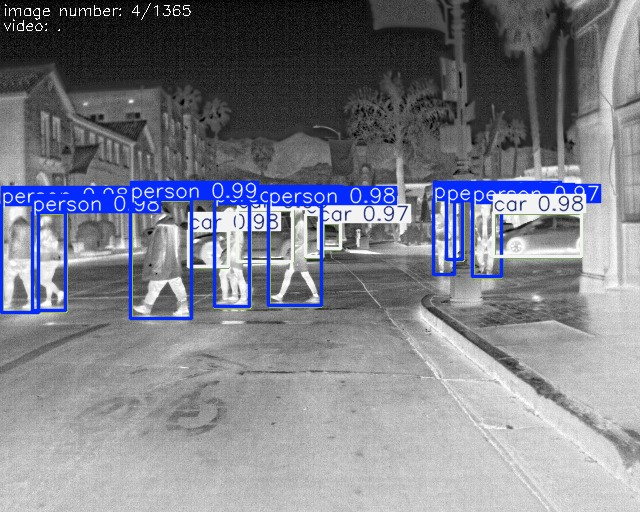

...

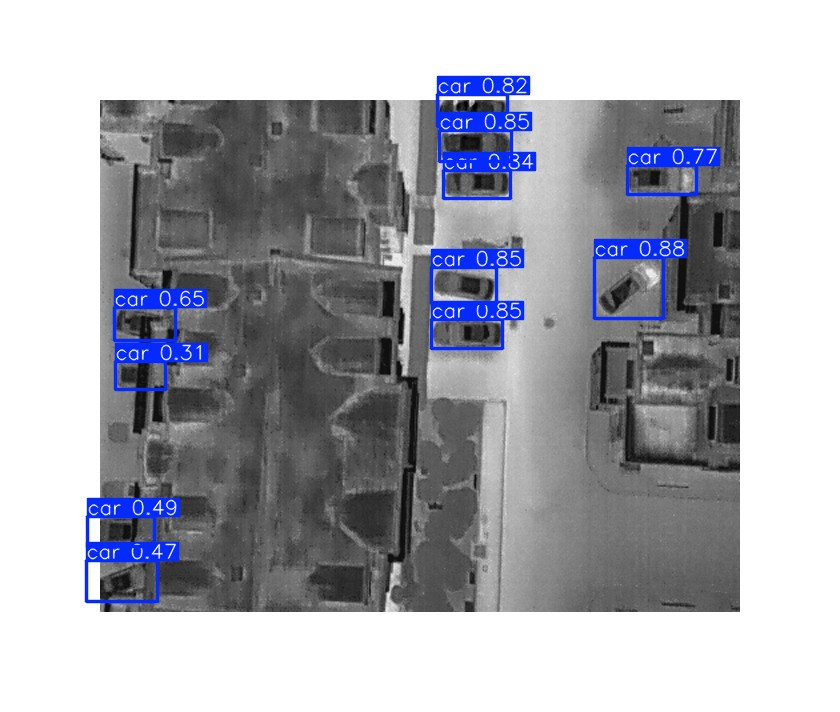

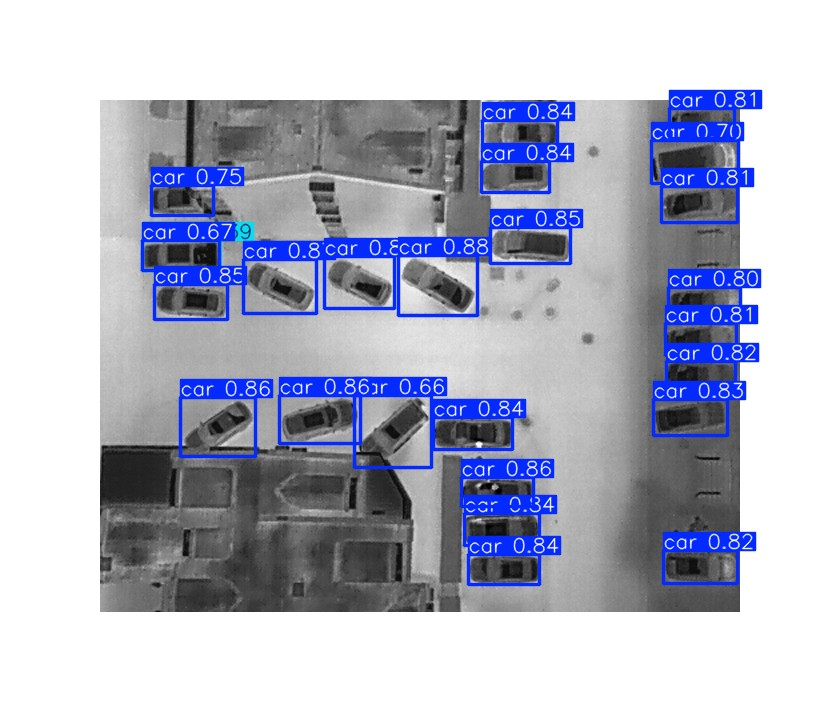

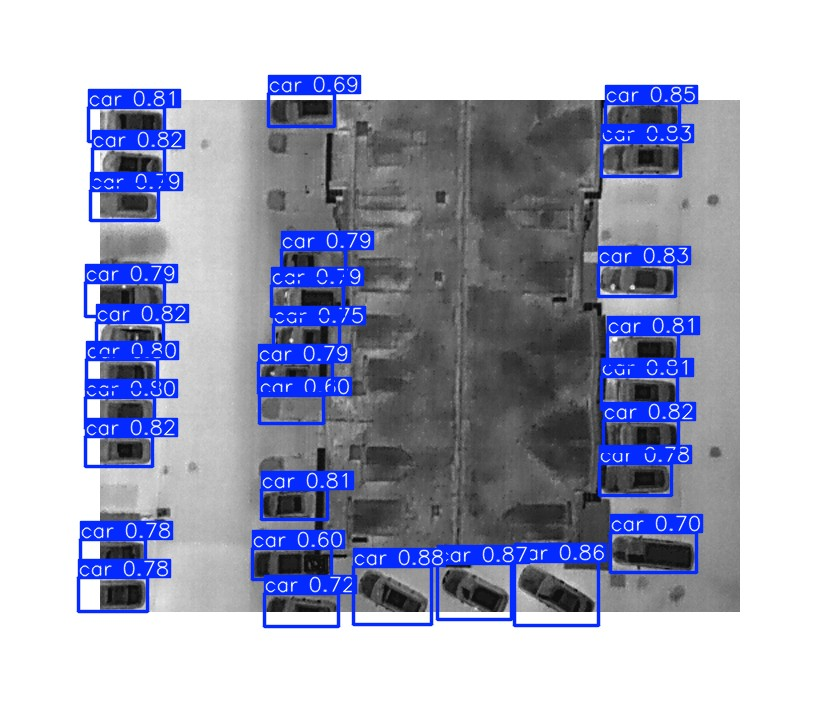

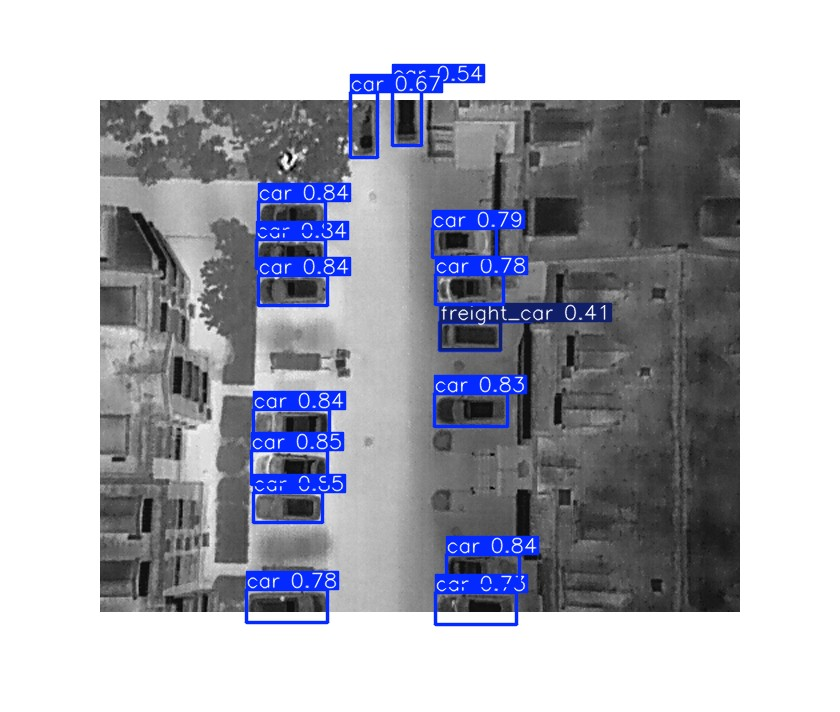

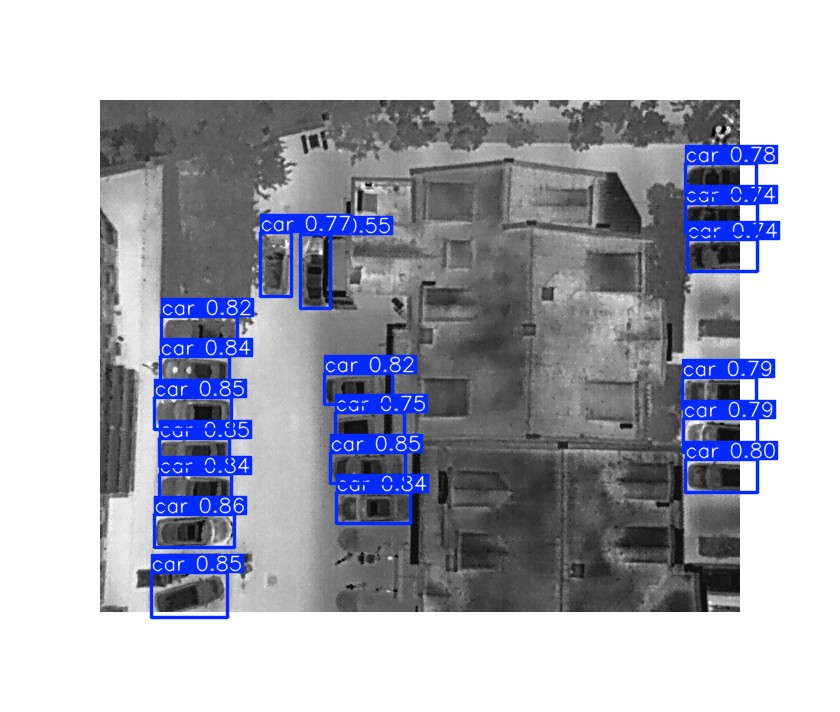

[DONE] Detection visualisations saved and displayed: 30 images


In [18]:
from IPython.display import Image as IPyImage, display

from visualise.save_detections import save_detection_images

visualisation_jobs = [
    ("thermal_yolo11s", thermal_weights, thermal_yaml),
    ("eo_yolo11s", eo_weights, eo_yaml),
    ("ir_yolo11s", ir_weights, ir_yaml),
]
visualisation_paths = []
for model_name, weights, dataset_yaml in visualisation_jobs:
    visualisation_paths.extend(save_detection_images(weights, dataset_yaml, model_name, num_images=10))

for path in visualisation_paths:
    display(IPyImage(filename=path))
print(f"[DONE] Detection visualisations saved and displayed: {len(visualisation_paths)} images")

## 10. Generate report

In [19]:
from pathlib import Path

from report.generate_report import generate_report
from utils.env import get_output_dir

report_path = generate_report()
print(report_path.read_text(encoding="utf-8"))

expected_paths = [
    report_path,
    get_output_dir() / "logs" / "benchmark.json",
    get_output_dir() / "logs" / "fusion.json",
    get_output_dir() / "logs" / "dataset_summary.json",
    Path(thermal_weights),
    Path(eo_weights),
    Path(ir_weights),
]
for path in expected_paths:
    print(("[DONE]" if Path(path).exists() else "[MISSING]"), Path(path))
print("[DONE] Report generated and output files confirmed")

✅ [DONE] Report generated: /mnt/nightswatch-poc/poc_outputs/poc_report.md
# Night's Watch PoC — Preliminary Benchmark Results

## 1. Hardware Environment

| GPU | VRAM (GB) | CUDA | PyTorch | Ultralytics | Date |
| --- | --- | --- | --- | --- | --- |
| NVIDIA L4 | 23.66 | 12.9 | 2.8.0+cu129 | 8.3.253 | 2026-05-02T02:28:48Z |

## 2. Datasets Used

| Dataset | Modality | Train images | Val images | Classes | Source |
| --- | --- | --- | --- | --- | --- |
| Thermal | IR/LWIR | 12026 | 1360 | 5 | unknown |
| EO | EO/RGB | 17467 | 8746 | 5 | unknown |
| IR | IR/LWIR | 17940 | 8965 | 5 | unknown |

## 3. Benchmark Results

All latency measurements are averaged over 100 measured runs after 20 warmup runs, with the first 10 measured runs dropped for stabilisation. Jetson figures are labelled projections, not device measurements.

### thermal_yolo11s

| Model | Dataset | mAP@0.5 | mAP@0.5:0.95 | Prec | Recall | FP32 (ms) | FP16 (ms) | ONNX (ms) | Jetson est. (ms) | Mem (GB) |
| --- | --- | --- 

## 11. Final file listing

In [20]:
from pathlib import Path

from utils.env import get_output_dir

output_root = get_output_dir()
for path in sorted(output_root.rglob("*")):
    print(path.relative_to(output_root))
print("[DONE] Final poc_outputs listing complete")

dataset_configs
dataset_configs/dronevehicle_ir.yaml
dataset_configs/dronevehicle_rgb.yaml
dataset_configs/flir_thermal.yaml
logs
logs/benchmark.json
logs/dataset_summary.json
logs/fusion.json
logs/prep_manifest.json
logs/training.json
models
models/eo_best.onnx
models/eo_best.pt
models/ir_best.onnx
models/ir_best.pt
models/thermal_best.onnx
models/thermal_best.pt
poc_report.md
training_runs
training_runs/eo_unimodal_yolo11s
training_runs/eo_unimodal_yolo11s/BoxF1_curve.png
training_runs/eo_unimodal_yolo11s/BoxPR_curve.png
training_runs/eo_unimodal_yolo11s/BoxP_curve.png
training_runs/eo_unimodal_yolo11s/BoxR_curve.png
training_runs/eo_unimodal_yolo11s/args.yaml
training_runs/eo_unimodal_yolo11s/confusion_matrix.png
training_runs/eo_unimodal_yolo11s/confusion_matrix_normalized.png
training_runs/eo_unimodal_yolo11s/labels.jpg
training_runs/eo_unimodal_yolo11s/results.csv
training_runs/eo_unimodal_yolo11s/results.png
training_runs/eo_unimodal_yolo11s/train_batch0.jpg
training_runs/eo_uni